#Questionnaire - Machine Learning Internship
Objective: Develop a machine learning model that can classify images of industrial equipment into two categories: 'defective' and 'non-defective'.

Dataset Used : Railway Track Fault Detection.
Link : https://drive.google.com/drive/folders/1vGuj-3f_Xn5vV6ryd_2rZPkg9HBybujY?usp=drive_link.

Brief Description:

--> Took a Railway track fault detection dataset and classified them between Defective and Non Defective.

--> Used Numpy , pandas, tensorflow , keras , matplotlib , seaborn and scikit learn for Data analysis , manipulation & visualization. Used a VGG16 model and froze its layers to add more of ours. Saved the updated weights,training history and the model.

# IMPORTING ALL THE NECESSARY LIBRARIES.

In [59]:
import pandas as pd
import numpy as np
import os
import tensorflow as tf
import cv2
from tensorflow import keras

from  matplotlib import pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import precision_score, recall_score, ConfusionMatrixDisplay,confusion_matrix, classification_report,accuracy_score, f1_score
import random
import seaborn as sns

from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from keras.callbacks import ReduceLROnPlateau

from PIL import Image

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Flatten, Reshape, MaxPool2D,BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping


# DATA VISUALIZATION.

In [60]:
def visualize_data(path):

    src_path = path
    sub_class = os.listdir(src_path)

    fig = plt.figure(figsize=(20,10))

    count=1
    for label in range(len(sub_class)):
        path = os.path.join(src_path,sub_class[label])
        img = os.listdir(path)


        for i in img[:4]:
            plt.subplot(2,4,count)
            image = Image.open(path+"/"+i)
            image = image.resize((300,300))
            plt.imshow(image)
            plt.title(sub_class[label])
            count+=1

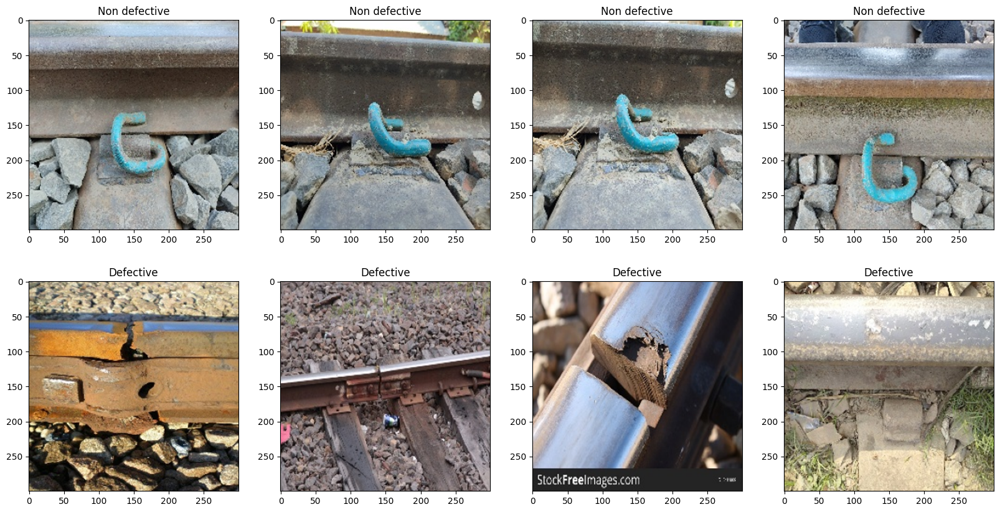

In [61]:
visualize_data("/content/drive/MyDrive/archive1/train")

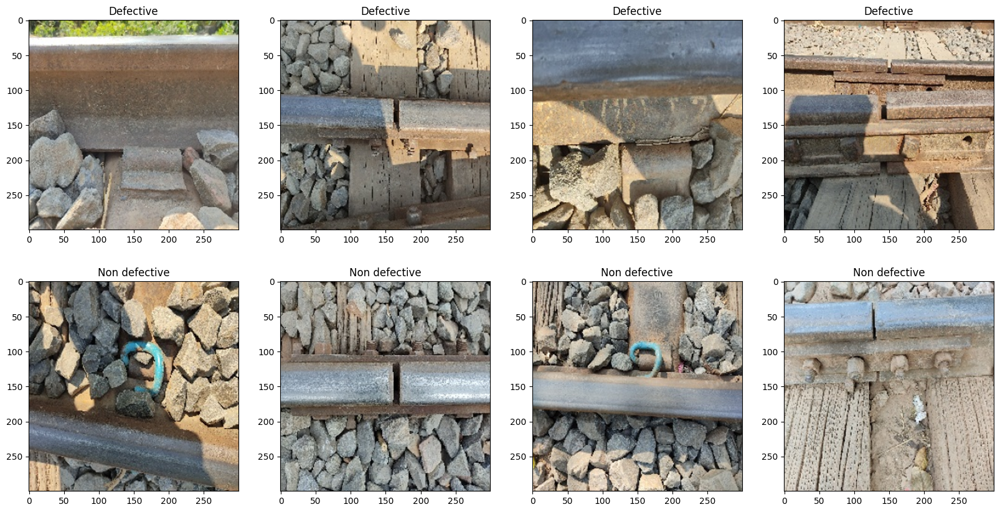

In [62]:
visualize_data("/content/drive/MyDrive/archive1/valid")

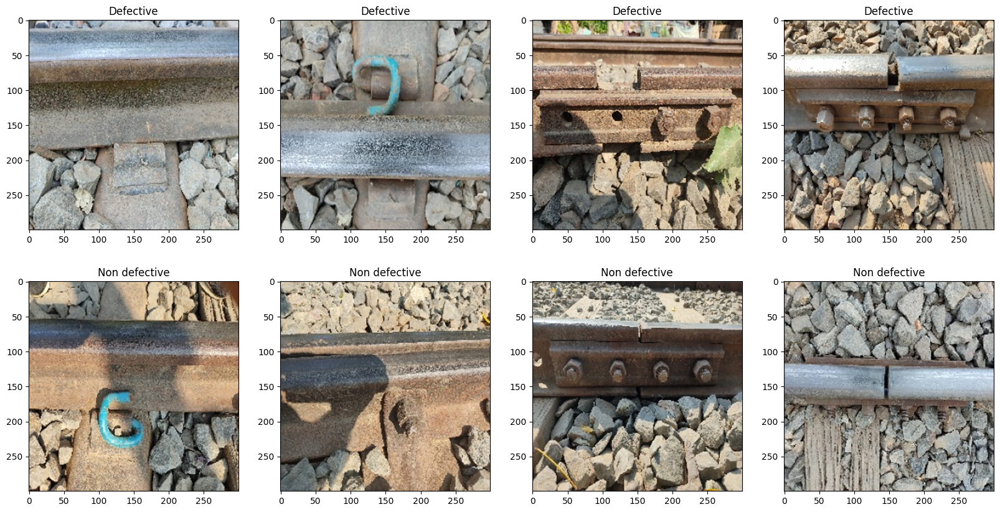

In [63]:
visualize_data("/content/drive/MyDrive/archive1/test")

# DATA AUGMENTATION OF THE PHOTOS.

In [64]:
train_generator = ImageDataGenerator(rescale=1./255,
                                     shear_range=0.2,
                                      zoom_range=0.3,
                                      width_shift_range=0.3,
                                      height_shift_range=0.2,
                                      brightness_range=[0.4,1.5],
                                      horizontal_flip=True,
                                      vertical_flip =True
                                     )
val_generator = ImageDataGenerator(rescale=1./255)

test_generator = ImageDataGenerator(rescale=1./255)

train_generator = train_generator.flow_from_directory(
    directory="/content/drive/MyDrive/archive1/train",
    target_size=(224, 224),
    color_mode="rgb",
    class_mode='categorical',
    batch_size = 32,
    subset='training')

validation_generator = val_generator.flow_from_directory(
    directory="/content/drive/MyDrive/archive1/valid",
    target_size=(224,224),
    color_mode="rgb",
    class_mode='categorical',
    batch_size = 32,
    shuffle=False)

test_generator = test_generator.flow_from_directory(
    directory="/content/drive/MyDrive/archive1/test",
    target_size=(224,224),
    color_mode="rgb",
    class_mode='categorical',
    batch_size = 32,
    shuffle = False)

Found 299 images belonging to 2 classes.
Found 62 images belonging to 2 classes.
Found 22 images belonging to 2 classes.


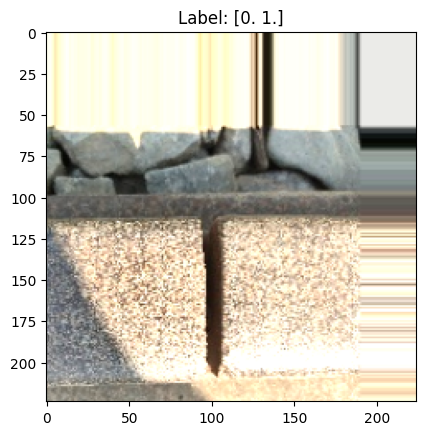

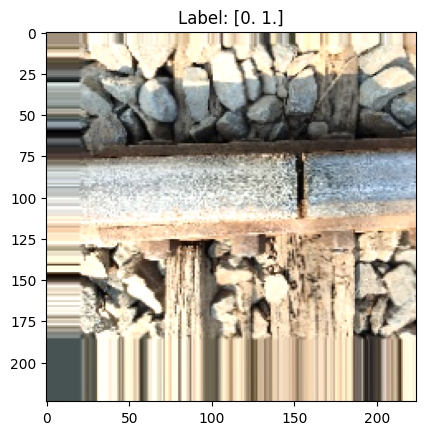

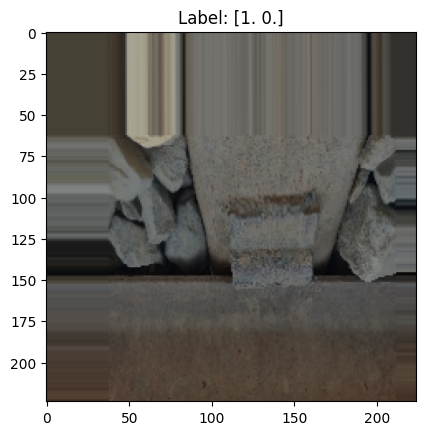

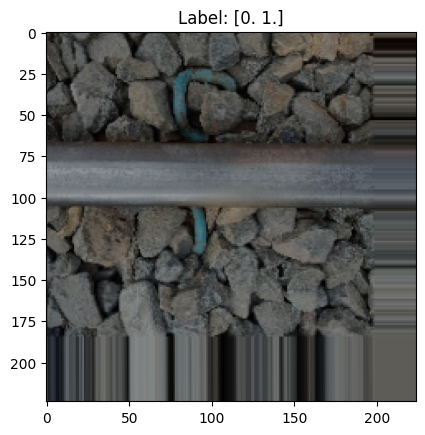

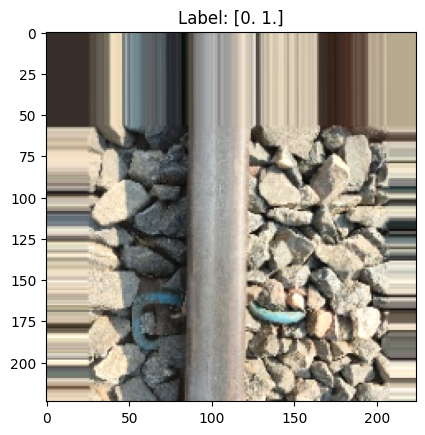

In [65]:
import matplotlib.pyplot as plt

def visualize_images(generator, num_images=5):
  for i in range(num_images):
    image, label = next(generator)
    plt.imshow(image[0])
    plt.title(f"Label: {label[0]}")
    plt.show()

visualize_images(train_generator)


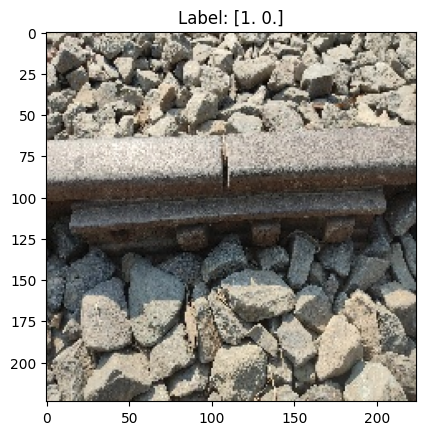

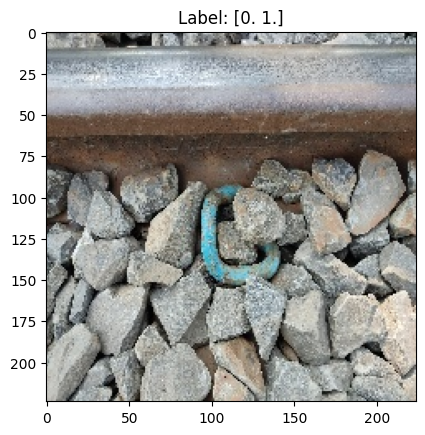

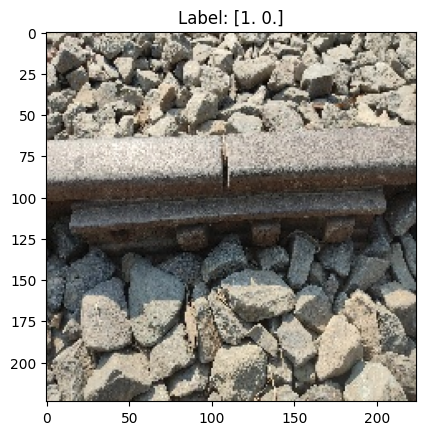

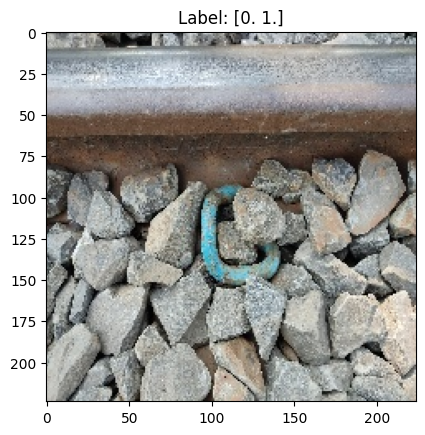

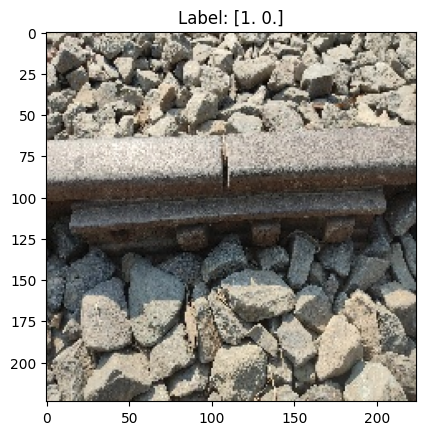

In [66]:
visualize_images(validation_generator)

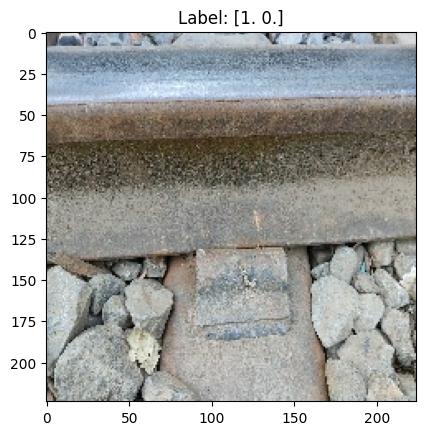

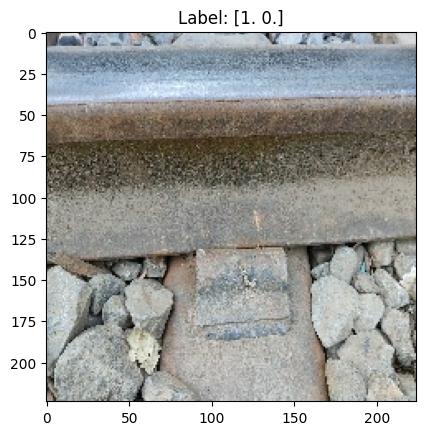

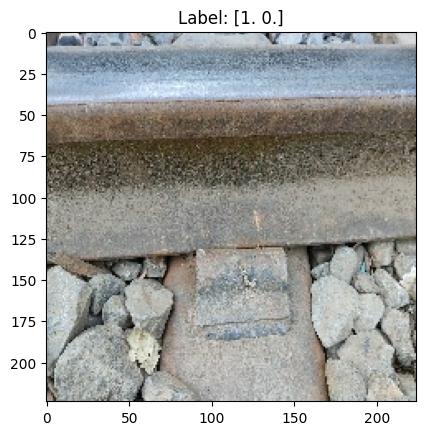

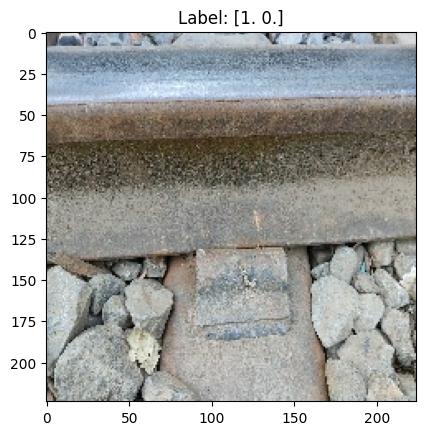

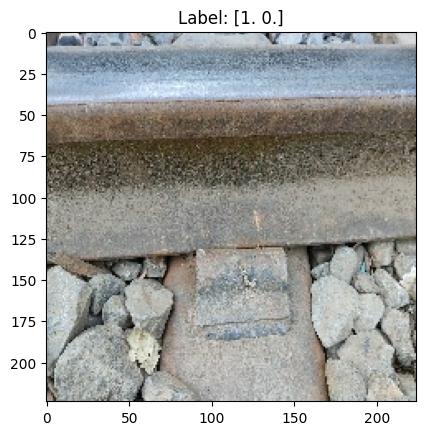

In [67]:
visualize_images(test_generator)

# MODEL BUILDING AND TRAINING.

In [68]:
def train_model(model, train_generator, validation_generator, epochs,name):
    path_cp = name + '_vowels_weights.hdf5'
    rlr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 4, verbose = 1,
                                min_delta = 1e-4, min_lr = 1e-4, mode = 'min', cooldown=1)
    ckp = ModelCheckpoint(path_cp,monitor = 'val_loss',
                      verbose = 1, save_best_only = True, mode = 'min')
    es = EarlyStopping(monitor = 'val_loss', min_delta = 1e-4, patience = 6,mode = 'min', restore_best_weights = True, verbose = 1)

    # Fitting the model
    history = model.fit(train_generator,
                          epochs = epochs,
                          validation_data = validation_generator,
                          verbose = 1,
                          callbacks = [rlr,es,ckp])

    return history

In [69]:
from tensorflow.keras.applications.vgg16 import VGG16

model_train = VGG16(input_shape=(224,224,3) , weights='imagenet', include_top=False)

for layer in model_train.layers:
    layer.trainable = False

x = Reshape((7*7,512))(model_train.output)
x = Flatten()(x)
x = Dense(128)(x)
x = Dense(64)(x)
prediction = Dense(2, activation='softmax')(x)

# create a model object
model = Model(inputs=model_train.input, outputs=prediction)

In [70]:
model.compile(optimizer = tf.optimizers.Adam(learning_rate=0.001) , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

# 50 EPOCHS FOR TRAINING

In [71]:
train_history = train_model(model, train_generator,validation_generator, epochs = 50,name="vgg16")

Epoch 1/50
10/10 [==============================] - ETA: 0s - loss: 11.3464 - accuracy: 0.5251
Epoch 1: val_loss improved from inf to 1.08244, saving model to vgg16_vowels_weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 11s 958ms/step - loss: 11.3464 - accuracy: 0.5251 - val_loss: 1.0824 - val_accuracy: 0.7419 - lr: 0.0010
Epoch 2/50
10/10 [==============================] - ETA: 0s - loss: 1.2160 - accuracy: 0.6221
Epoch 2: val_loss did not improve from 1.08244
10/10 [==============================] - 7s 648ms/step - loss: 1.2160 - accuracy: 0.6221 - val_loss: 1.2298 - val_accuracy: 0.5968 - lr: 0.0010
Epoch 3/50
10/10 [==============================] - ETA: 0s - loss: 0.6384 - accuracy: 0.6957
Epoch 3: val_loss improved from 1.08244 to 0.69779, saving model to vgg16_vowels_weights.hdf5
10/10 [==============================] - 8s 789ms/step - loss: 0.6384 - accuracy: 0.6957 - val_loss: 0.6978 - val_accuracy: 0.5968 - lr: 0.0010
Epoch 4/50
10/10 [==============================] - ETA: 0s - loss: 0.6856 - accuracy: 0.6689
Epoch 4: val_loss improved from 0.69779 to 0.45370, saving model to vgg16_vowels_weights.hdf5
10/10 [==============================] - 7s 734ms

# MODEL EVALUATION

In [72]:
model.evaluate(train_generator)

10/10 [==============================] - 7s 713ms/step - loss: 0.4238 - accuracy: 0.7860


[0.4238182306289673, 0.785953164100647]

In [73]:
model.evaluate(validation_generator)


2/2 [==============================] - 1s 168ms/step - loss: 0.3758 - accuracy: 0.8710


[0.3757971525192261, 0.8709677457809448]

In [74]:
model.evaluate(test_generator)



1/1 [==============================] - 0s 227ms/step - loss: 0.6138 - accuracy: 0.6364


[0.6138250231742859, 0.6363636255264282]

# SAVING THE MODEL IN HDF5 FORMAT

In [75]:
tf.keras.models.save_model(model,"vgg16_model.h5")

<ipython-input-75-d8e8996d730f>:1: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  tf.keras.models.save_model(model,"vgg16_model.h5")


# SAVING MODEL'S HISTORY IN TRAINING.

In [76]:
import pickle
with open('vgg16_history.pkl', 'wb') as file_pi:
    pickle.dump(train_history.history, file_pi)

#loading the history
with open('vgg16_history.pkl', "rb") as file_pi:
    history = pickle.load(file_pi)

# PLOTTING ACCURACY AND LOSS FOR TRAINING AND TESTING DATA.

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


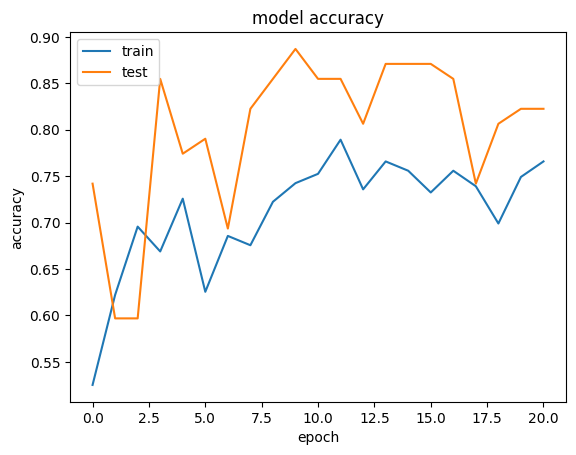

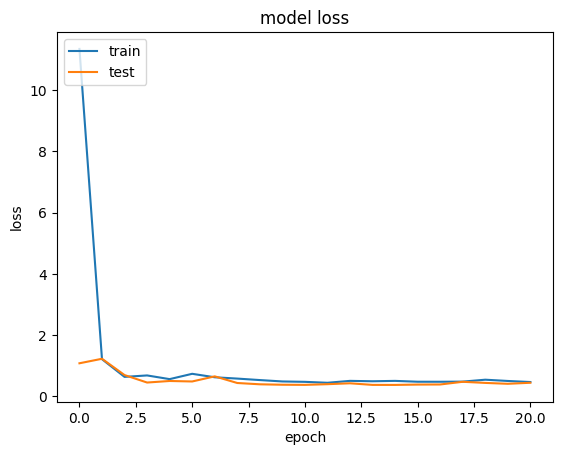

In [77]:
print(history.keys())
# summarize history for accuracy
plt.plot(history['accuracy'])
plt.plot(history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')




plt.show()
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# CONFUSION MATRIX

In [78]:
def metric_visualization(generator):

    y_pred = model.predict(generator)
    y_pred_label = np.argmax(y_pred,axis=1)

    #true labels
    y_test = generator.classes

    class_report =  classification_report(y_test,y_pred_label,target_names=['fault','no fault'],output_dict=True)
    sns.heatmap(pd.DataFrame(class_report).iloc[:-1, :].T, annot=True,cmap='inferno')

    conf_matrix = confusion_matrix(y_test, y_pred_label)
    plt.figure(figsize=(10,6))
    fx=sns.heatmap(confusion_matrix(y_test,y_pred_label), annot=True, fmt=".2f",cmap="inferno")
    fx.set_title('Confusion Matrix \n')
    fx.set_xlabel('\n Predicted Values\n')
    fx.set_ylabel('Actual Values\n')
    fx.xaxis.set_ticklabels(['fault','no fault'])
    fx.yaxis.set_ticklabels(['fault','no fault'])
    plt.show()

2/2 [==============================] - 0s 154ms/step


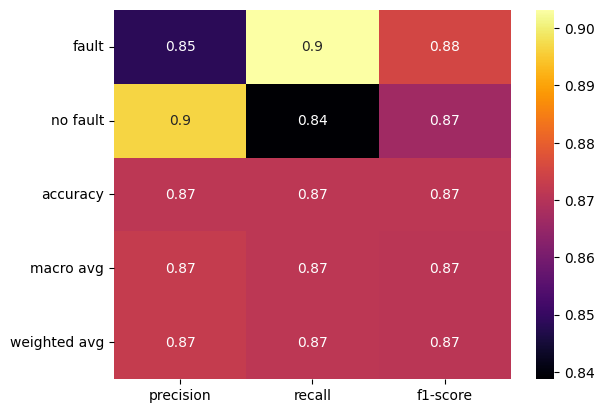

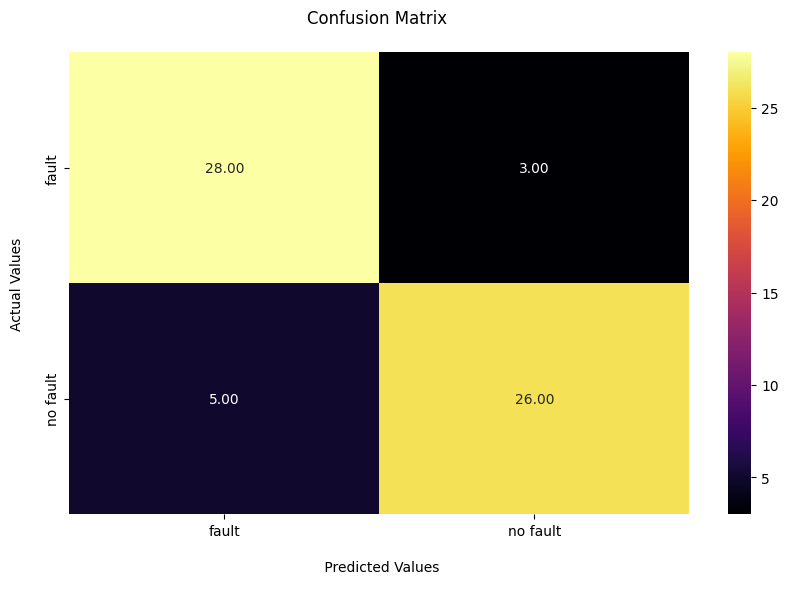

In [79]:
metric_visualization(validation_generator)

1/1 [==============================] - 0s 135ms/step


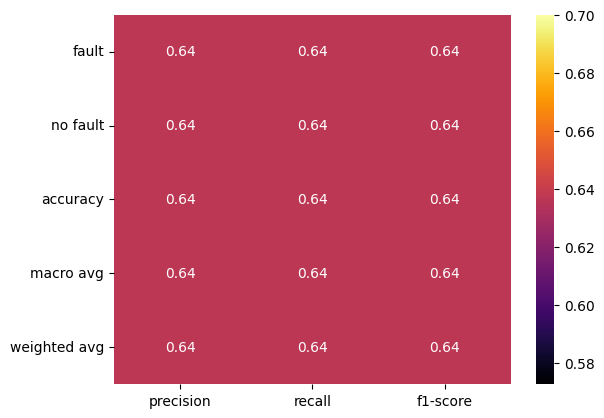

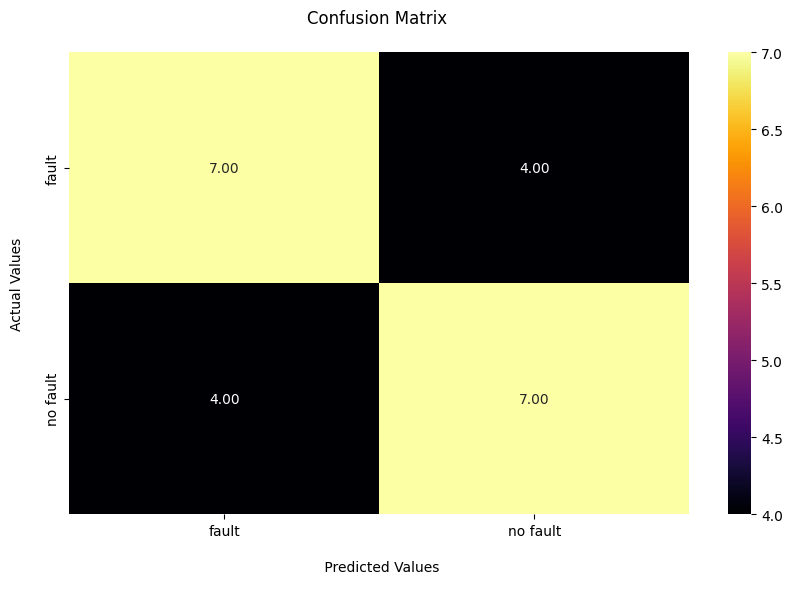

In [80]:
metric_visualization(test_generator)